<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Face-Recognition-using-PCA" data-toc-modified-id="Face-Recognition-using-PCA-1">Face Recognition using PCA</a></span><ul class="toc-item"><li><span><a href="#Load-data" data-toc-modified-id="Load-data-1.1">Load data</a></span></li><li><span><a href="#Stratified-train-test-split" data-toc-modified-id="Stratified-train-test-split-1.2">Stratified train-test split</a></span></li></ul></li><li><span><a href="#Training-data" data-toc-modified-id="Training-data-2">Training data</a></span><ul class="toc-item"><li><span><a href="#Prinicpal-Component-Analysis" data-toc-modified-id="Prinicpal-Component-Analysis-2.1">Prinicpal Component Analysis</a></span></li><li><span><a href="#Eigen-faces" data-toc-modified-id="Eigen-faces-2.2">Eigen faces</a></span></li><li><span><a href="#Regenerated-faces-using-Eigen-vectors" data-toc-modified-id="Regenerated-faces-using-Eigen-vectors-2.3">Regenerated faces using Eigen vectors</a></span></li><li><span><a href="#Error-analysis-on-regenerated-faces" data-toc-modified-id="Error-analysis-on-regenerated-faces-2.4">Error analysis on regenerated faces</a></span></li></ul></li><li><span><a href="#Test-data" data-toc-modified-id="Test-data-3">Test data</a></span><ul class="toc-item"><li><span><a href="#Weights-and-regenerated-faces" data-toc-modified-id="Weights-and-regenerated-faces-3.1">Weights and regenerated faces</a></span></li></ul></li><li><span><a href="#Train-the-model-and-test" data-toc-modified-id="Train-the-model-and-test-4">Train the model and test</a></span><ul class="toc-item"><li><span><a href="#Optimum-number-of-components" data-toc-modified-id="Optimum-number-of-components-4.1">Optimum number of components</a></span></li><li><span><a href="#Model---Face-recognition-using-weight-vector-and-its-distance-from-mean" data-toc-modified-id="Model---Face-recognition-using-weight-vector-and-its-distance-from-mean-4.2">Model - Face recognition using weight vector and its distance from mean</a></span></li><li><span><a href="#Test-different-models" data-toc-modified-id="Test-different-models-4.3">Test different models</a></span></li></ul></li><li><span><a href="#Mirror-faces-to-improve-accuracy" data-toc-modified-id="Mirror-faces-to-improve-accuracy-5">Mirror faces to improve accuracy</a></span><ul class="toc-item"><li><span><a href="#Add-Mirror-faces-to-training-data" data-toc-modified-id="Add-Mirror-faces-to-training-data-5.1">Add Mirror faces to training data</a></span></li><li><span><a href="#Test-model-using-Mirror-faces" data-toc-modified-id="Test-model-using-Mirror-faces-5.2">Test model using Mirror faces</a></span></li></ul></li><li><span><a href="#Random-faces/Noise" data-toc-modified-id="Random-faces/Noise-6">Random faces/Noise</a></span><ul class="toc-item"><li><span><a href="#Regenerate-using-Eigen-faces" data-toc-modified-id="Regenerate-using-Eigen-faces-6.1">Regenerate using Eigen faces</a></span></li><li><span><a href="#Predict-face" data-toc-modified-id="Predict-face-6.2">Predict face</a></span></li></ul></li><li><span><a href="#Final-model" data-toc-modified-id="Final-model-7">Final model</a></span><ul class="toc-item"><li><span><a href="#Faces-that-failed-prediction" data-toc-modified-id="Faces-that-failed-prediction-7.1">Faces that failed prediction</a></span></li><li><span><a href="#Save-the-data" data-toc-modified-id="Save-the-data-7.2">Save the data</a></span></li></ul></li><li><span><a href="#Summary" data-toc-modified-id="Summary-8">Summary</a></span></li></ul></div>

# Face Recognition using PCA

In this notebook, we would analyze the olivetti faces (dataset available publicly, lately incorporated in sklearn). We would randomly split the dataset into train and test, create Eigen faces and mean face from training data and we would then try to regenerate the train and test faces using mean and Eigen faces.

In [143]:
# Import library / packages

# For numerical operation
import numpy as np

# Pandas for tabular manipulations
import pandas as pd

# For plots
from matplotlib import pyplot as plt

# Train-test split
from sklearn.model_selection import train_test_split

# For PCA
from sklearn.decomposition import PCA

# Support Vector Machine
from sklearn.svm import SVC

# K-Nearest Neighbour
from sklearn.neighbors import KNeighborsClassifier


## Load data

In [144]:
# Load the faces
faces_image = np.load('Faces\\olivetti_faces.npy')
faces_target = np.load('Faces\\olivetti_faces_target.npy')

# Find the dimension
faces_image.shape, faces_target.shape

((400, 64, 64), (400,))

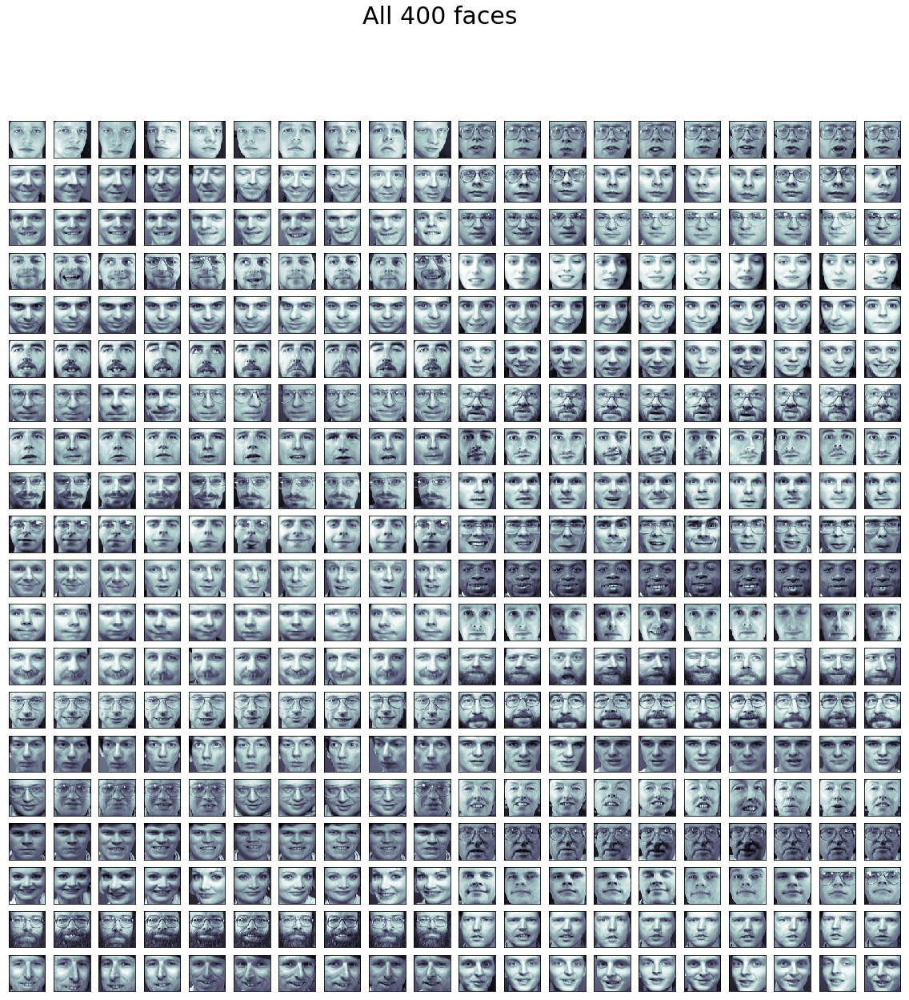

In [145]:
# View all the 400 faces
fig, axes = plt.subplots(20,20,figsize=(20,20),\
                        subplot_kw = {'xticks':[],'yticks':[]})

plt.suptitle('All 400 faces', fontsize = 30)

for i, ax in enumerate(axes.flat) :
    ax.imshow(faces_image[i,:,:].reshape(64,64), cmap = 'bone')

## Stratified train-test split
The split should be stratified for accurate test results. Stratified split ensures that data from each class/category of dataset are distributed between train and test based on the size defined.

In [146]:
# Split the train and test images
faceimg_train, faceimg_test, facetrg_train, facetrg_test = train_test_split(faces_image, faces_target,\
                                                    stratify = faces_target, test_size = 0.30)

In [147]:
# Flatten all images
X_train = faceimg_train.reshape(faceimg_train.shape[0],-1)
X_test = faceimg_test.reshape(faceimg_test.shape[0],-1)
Y_train = facetrg_train.reshape(-1,1) 
Y_test = facetrg_test.reshape(-1,1)

# Training data

## Prinicpal Component Analysis

In [148]:
# Find all Principal Components
max_features = 200
pca = PCA(n_components=max_features)
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=200, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

## Eigen faces

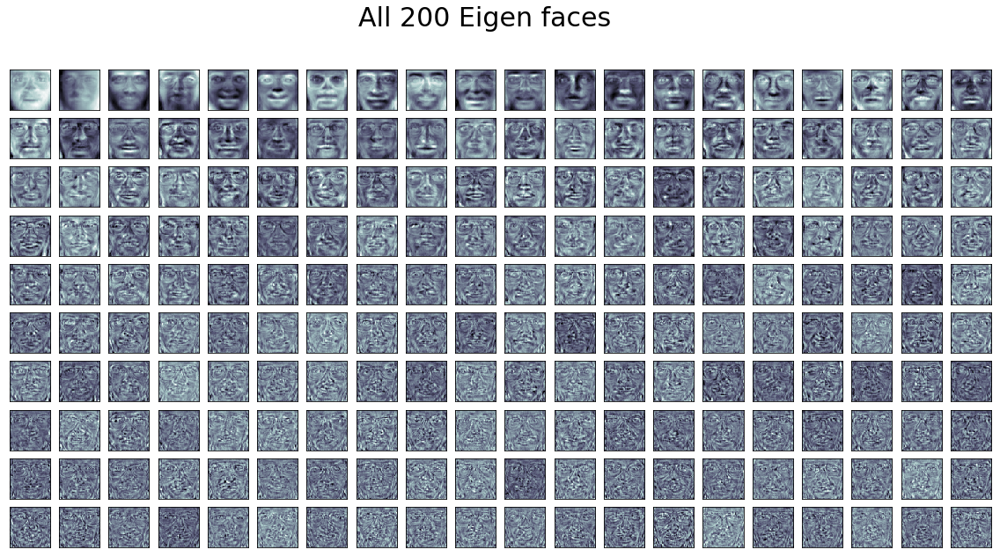

In [149]:
# View all the 200 Eigen faces
fig, axes = plt.subplots(10,20,figsize=(20,10),\
                        subplot_kw = {'xticks':[],'yticks':[]})

plt.suptitle('All 200 Eigen faces', fontsize = 30)

for i, ax in enumerate(axes.flat) :
    ax.imshow(pca.components_[i,:].reshape(64,64), cmap = 'bone')

In [150]:
# Extract other informations
Eigen_val = pca.explained_variance_
Eigen_vec = pca.components_
Weight_train = pca.transform(X_train)
Mean_face = pca.mean_

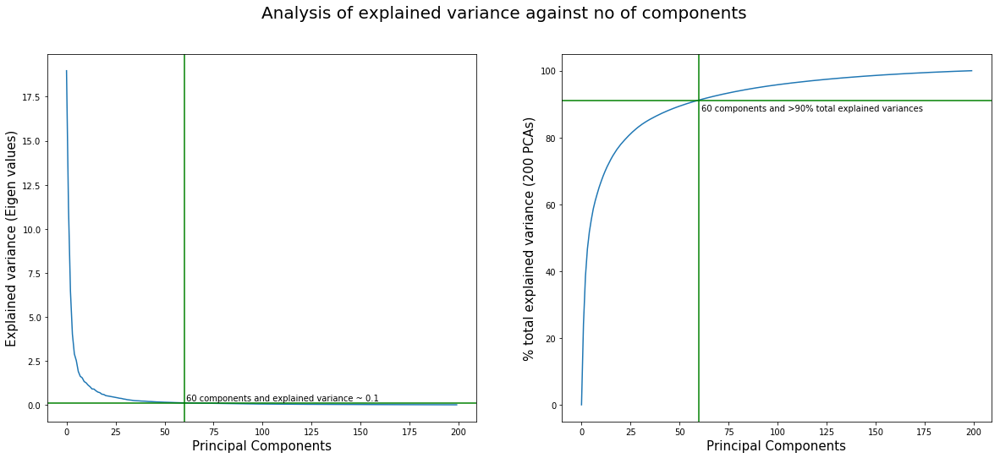

In [151]:
# Plot of Eigen values for each components
fig, axes = plt.subplots(1,2, figsize = (20,8))

axes[0].plot(Eigen_val)
axes[0].axvline(x=60, color = 'green')
axes[0].axhline(y=0.12, color = 'green')
axes[0].set_xlabel('Principal Components', fontsize=15)
axes[0].set_ylabel('Explained variance (Eigen values)', fontsize=15)
axes[0].text(61,0.25, '60 components and explained variance ~ 0.1')

x = np.array([np.sum(Eigen_val[0:i])*100/np.sum(Eigen_val) for i in range(len(Eigen_val))])
axes[1].plot(x)
axes[1].axvline(x=60, color = 'green')
axes[1].axhline(y=91, color = 'green')
axes[1].set_xlabel('Principal Components', fontsize=15)
axes[1].set_ylabel('% total explained variance (200 PCAs)', fontsize=15)
axes[1].text(61,88, '60 components and >90% total explained variances')

plt.suptitle('Analysis of explained variance against no of components', fontsize=20)
plt.show()

## Regenerated faces using Eigen vectors

In [152]:
# Regenerate some random faces
def show_regenerated_faces(X, Weights,cat) :
    
    fig, axes = plt.subplots(20,20,figsize=(22,22),\
                            subplot_kw = {'xticks':[],'yticks':[]})

    plt.suptitle('Original, Mean and regenerated face using Eigen faces - ' + cat, fontsize = 30)

    random_faces = np.random.choice(Weights.shape[0],20)

    for i, ax in enumerate(axes.flat) :
        j = random_faces[int(i / 20)]
        if (i % 20 ) == 0 :
            ax.imshow(X[j,:].reshape(64,64), cmap = 'bone')
            if int(i / 20) == 19 :
                ax.set_xlabel('Original')
            elif int(i / 20) == 0 :
                ax.set_title('Original')
        elif (i % 20 ) == 1 :
            ax.imshow(Mean_face.reshape(64,64), cmap = 'bone')
            if int(i / 20) == 19 :
                ax.set_xlabel('Mean')
            elif int(i / 20) == 0 :
                ax.set_title('Mean')
        elif (i % 20 ) > 1 :
            k = 5*((i % 20)-1)
            face = Mean_face.reshape(1,-1) + np.dot(Weights[j,0:k],Eigen_vec[0:k,:])
            ax.imshow(face.reshape(64,64), cmap = 'bone')
            if int(i / 20) == 19 :
                ax.set_xlabel(str(k)+' Eigens')
            elif int(i / 20) == 0 : 
                ax.set_title(str(k)+' Eigens')
        
    

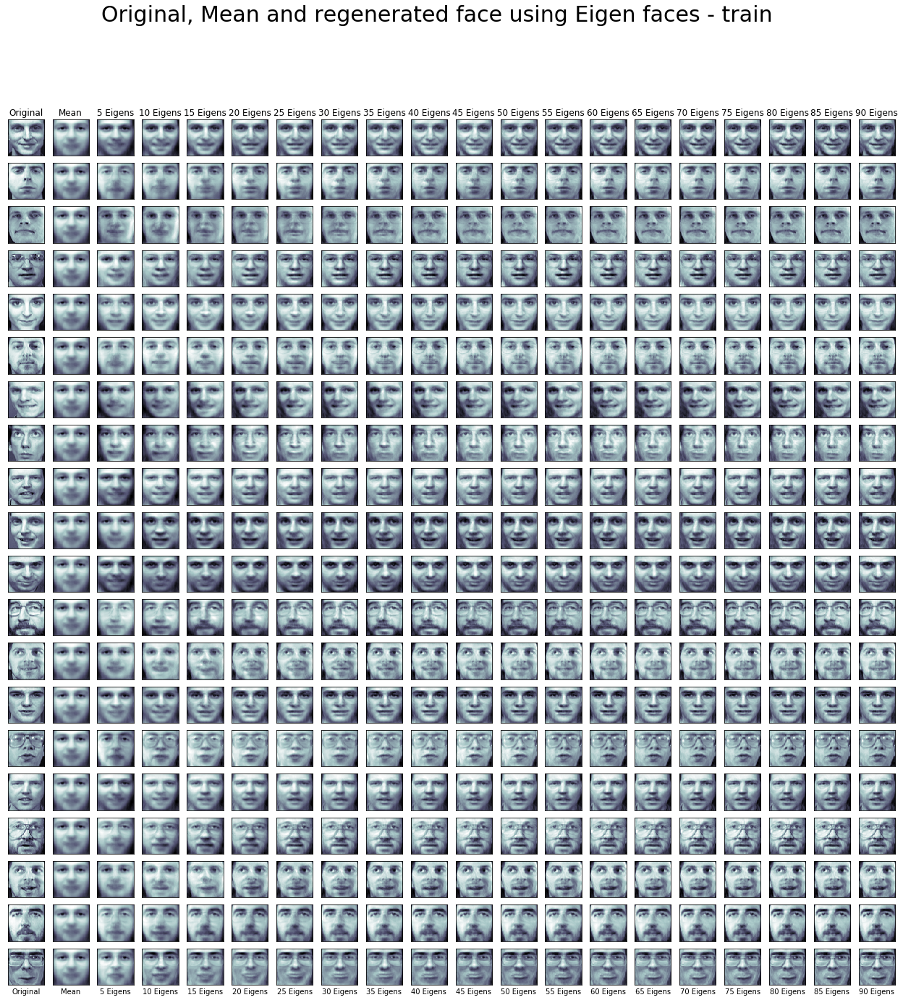

In [153]:
# Regenerated train faces
show_regenerated_faces(X_train, Weight_train, 'train')

## Error analysis on regenerated faces

In [154]:
# Error analysis of regenerated faces
Mean_Err_tr = np.array([])
Max_Err_tr = np.array([])
Min_Err_tr = np.array([])
for k in range(200) :
    Err = face_diff(X_train, Mean_face, Weight_train, Eigen_vec,k)    
    Mean_Err_tr = np.append(Mean_Err_tr,np.mean(Err,axis=0))
    Max_Err_tr = np.append(Max_Err_tr,np.max(Err,axis=0)) 
    Min_Err_tr = np.append(Min_Err_tr,np.min(Err,axis=0))

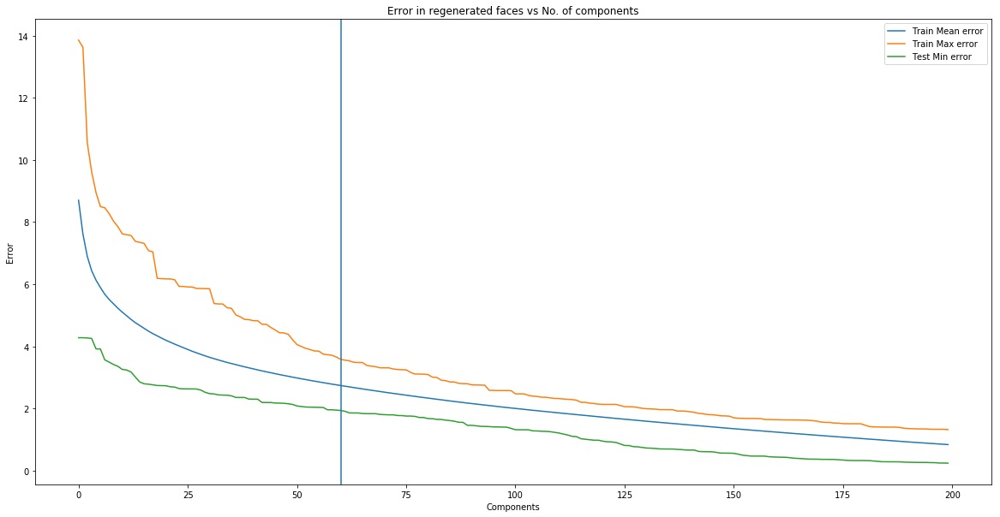

In [155]:
# Eror plot - training data
plt.figure(figsize=(20,10))
plt.plot(range(200),Mean_Err_tr, label = 'Train Mean error')
plt.plot(range(200),Max_Err_tr, label = 'Train Max error')
plt.plot(range(200),Min_Err_tr, label = 'Test Min error')
plt.axvline(x=60)
plt.xlabel('Components')
plt.ylabel('Error')
plt.title('Error in regenerated faces vs No. of components')
plt.legend()
plt.show()

As you would see from train and test dataset - Approx 60 (as few as) Eigen faces/weights (out of 4096) helps us regenerate a face quite close to original face. This is tremendous reduction in size due to PCA !!

# Test data

## Weights and regenerated faces

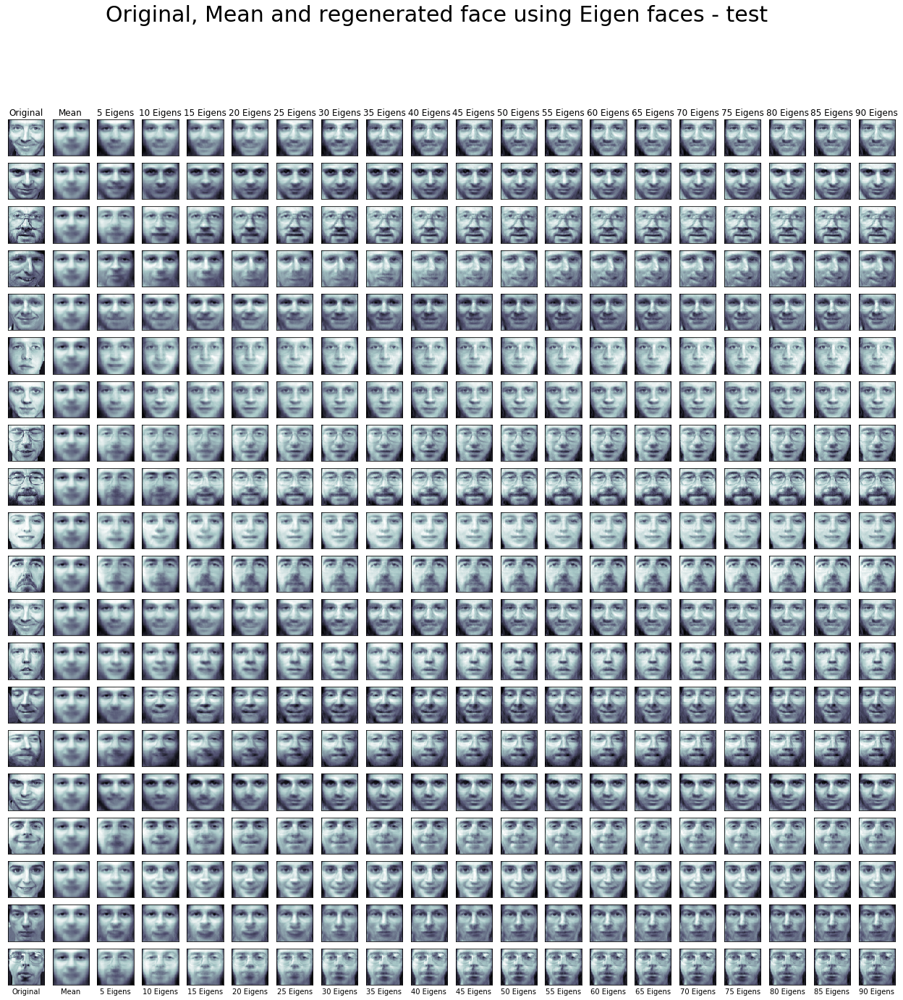

In [156]:
# Regenerated test faces
Weight_test = pca.transform(X_test)
show_regenerated_faces(X_test, Weight_test, 'test')

# Train the model and test

## Optimum number of components

In [157]:
# Train the model and plot the accuracy
def model_find_components(model, W_train, Y_train, W_test, Y_test, plot = 'Y', step=1) :
    Train_pred = np.array([]); Test_pred = np.array([])
    for i in range(0,W_train.shape[1],step) :
        
        # Filter components
        X_train = W_train[:,0:i+1]
        X_test = W_test[:,0:i+1]
                
        # Train the model        
        model.fit(X_train,Y_train.ravel())
    
        # Predict the result        
        Y_train_pred = model.predict(X_train)
        Y_test_pred = model.predict(X_test)
        Train_pred = np.append(Train_pred,np.sum(Y_train_pred.reshape(-1) == Y_train.reshape(-1))*100/Y_train.shape[0])
        Test_pred = np.append(Test_pred,np.sum(Y_test_pred.reshape(-1) == Y_test.reshape(-1))*100/Y_test.shape[0])
        
    if plot == 'Y' :
        plt.figure(figsize=(20,8))
        plt.plot(Train_pred, label = 'Train', color = 'green')
        plt.plot(Test_pred, label = 'Test', color = 'red')
        plt.legend()
        plt.xlabel('Components', fontsize=15)
        plt.ylabel('Accuracy', fontsize=15)
        plt.title('Accuracy of model prediction vs Number of components')
        plt.show()
    
    return(Train_pred, Test_pred)
    

## Model - Face recognition using weight vector and its distance from mean

The original paper that talks about face recognition using PCA or Eigen faces, use the distance method to predict. It uses Euclidean distance as well as Mahalanobis for prediction. The link to paper is given below and we would create a model class that tries to find the distance () of weight vectors for each training and test dataset, from the class mean. There are 40 different faces in the dataset hence 40 classes.

http://www.face-rec.org/algorithms/PCA/jcn.pdf



In [158]:
class Dist_mod :
    
    def __init__(self,typ='eu') :
        assert(typ in ['eu', 'mh'])
        self.typ = typ
        
    def fit(self,X,Y) :
                    
        # Find mean weights by class
        self.W_mean = pd.concat([pd.DataFrame(Y, columns = ['Label']), pd.DataFrame(X)], axis = 1)\
                                .groupby(['Label']).mean().values

        # Find std weights by class
        if self.typ == 'mh' :
            # Find std weights by class
            self.W_std = pd.concat([pd.DataFrame(Y, columns = ['Label']), pd.DataFrame(X)], axis = 1)\
                                .groupby(['Label']).std().values
            
            # Find class - using min mahalanobis distance
            self.out = self._mh_classdist(X, self.W_mean, self.W_std)
        
        elif self.typ == 'eu' :
            # Find class - using min euclidean distance
            self.out = self._eu_classdist(X, self.W_mean)
        
        # Maximum allowed distance from vector
        self.max_dist = np.max(self.out[:,1])
            
            
    # Find euclidean distance from each class
    def _eu_classdist(self,X,Mean) :
        distance = np.empty([X.shape[0], Mean.shape[0]])   
        for i, mean in enumerate(Mean) :            
            distance[:,i] = np.linalg.norm((X-mean.reshape(1,-1)), axis=1)  
        output = np.vstack((np.argmin(distance, axis = 1),np.min(distance, axis = 1))).T
        return(output)
    
    
    # Find mahalanobis distance from each class
    def _mh_classdist(self,X,Mean,std) :
        distance = np.empty([X.shape[0], Mean.shape[0]])     
        for i, mean in enumerate(Mean) :
            norm_vec = ((X-mean.reshape(1,-1))/std[i,:])        
            distance[:,i] = np.linalg.norm(norm_vec, axis=1)          
        output = np.vstack((np.argmin(distance, axis = 1),np.min(distance, axis = 1))).T    
        return(output)

            
    def predict(self,X, check_dist='Y', extr_dist='N') :
        if self.typ == 'eu' :
            # Predict class - using min euclidean distance
            self.out = self._eu_classdist(X, self.W_mean)
            
        elif self.typ == 'mh' :
            # Predict class - using min mahalanobis distance
            self.out = self._mh_classdist(X, self.W_mean, self.W_std)
        
        if check_dist == 'Y' :
            self.out[np.where(self.out[:,1] > self.max_dist),0] = np.nan
        
        if extr_dist == 'Y' :
            return(self.out[:,0],self.out[:,1])
        else :
            return(self.out[:,0])
    
    
    
        
    

## Test different models


In [159]:
Train_out = dict(); Test_out = dict();  model = dict()

In [160]:
# Model to predict class based on euclidean distance of weights from mean of each class
model['DISTEU'] = Dist_mod(typ='eu')
Train_out['DISTEU'], Test_out['DISTEU'] = model_find_components(model['DISTEU'], \
                                            Weight_train, Y_train, Weight_test, Y_test, plot = 'N')

In [161]:
# Model to predict class based on euclidean distance of weights from mean of each class
model['DISTMH'] = Dist_mod(typ='mh')
Train_out['DISTMH'], Test_out['DISTMH'] = model_find_components(model['DISTMH'], \
                                            Weight_train, Y_train, Weight_test, Y_test, plot = 'N')

In [162]:
# Support vector machine (RBF kernel)
model['SVCRBF'] = SVC(kernel='rbf', gamma='auto')
Train_out['SVCRBF'], Test_out['SVCRBF'] = model_find_components(model['SVCRBF'], \
                                            Weight_train, Y_train, Weight_test, Y_test, plot = 'N')

In [163]:
# KNN model (Euclidean distance and 1 neighbour)
model['KNN1EU'] = KNeighborsClassifier(n_neighbors=1)
Train_out['KNN1EU'], Test_out['KNN1EU'] = model_find_components(model['KNN1EU'],\
                                            Weight_train, Y_train, Weight_test, Y_test, plot = 'N')

In [164]:
# KNN model (Mahalanobis distance and 1 neighbour)
model['KNN1MH'] = KNeighborsClassifier(n_neighbors=1)
W_train = Weight_train / np.sqrt(Eigen_val)
W_test = Weight_test / np.sqrt(Eigen_val)
Train_out['KNN1MH'], Test_out['KNN1MH'] = model_find_components(model['KNN1MH'],\
                                            W_train, Y_train, W_test, Y_test, plot = 'N')

In [165]:
Method = dict()
Method['SVCRBF'] = 'SVC RBF (Weights)'
Method['DISTEU'] = 'Class Mean EU distance'
Method['DISTMH'] = 'Class Mean MH distance'
Method['KNN1EU'] = 'KNN 1 neigbour and EU distance (Weights)'
Method['KNN1MH'] = 'KNN 1 neigbour and MH distance (Weights)'

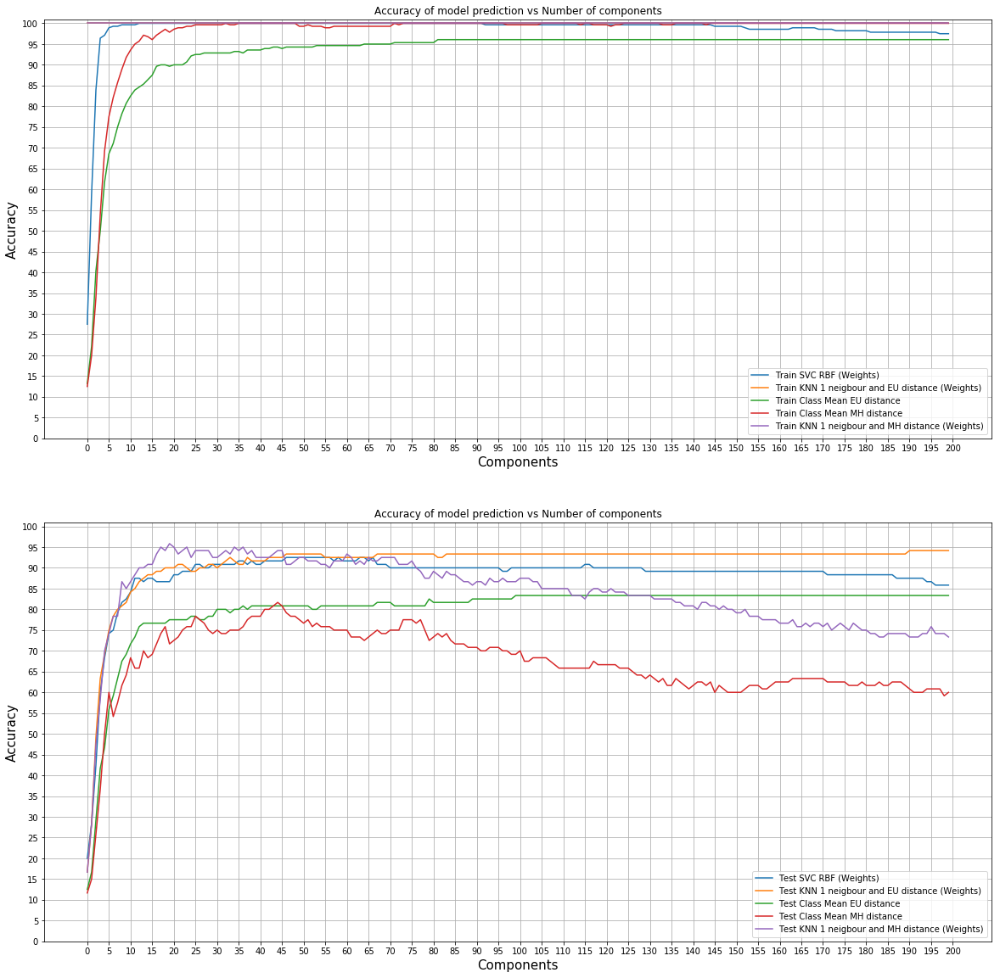

In [166]:
# Plot all Training and test accuracies
fig, axes = plt.subplots(2,1,figsize=(20,20))

for i, ax in enumerate(axes.flat) :
    for key in Train_out.keys():
        if i == 0 :
            ax.plot(Train_out[key], label = 'Train ' + Method[key])            
        else :
            ax.plot(Test_out[key], label = 'Test '+ Method[key])

    ax.legend(loc = 'lower right')
    ax.set_xlabel('Components', fontsize=15)
    ax.set_ylabel('Accuracy', fontsize=15)
    ax.set_title('Accuracy of model prediction vs Number of components')
    ax.set_ylim(0,101)
    ax.set_yticks(np.arange(0,101,5))
    ax.set_xticks(np.arange(0,201,5))
    ax.grid()

    
plt.show()


# Mirror faces to improve accuracy

Larger training set reduce overfitting since model to predict the class will have lot more faces to train however it is also important to NOT include any form of test data in training dataset. Hence we will create mirror faces of training dataset and add them in training data.

## Add Mirror faces to training data

In [167]:
# Produce mirror faces of all training dataset and add
Transform_mat = np.flip(np.diagflat(np.ones(faceimg_train.shape[1])),1)

def Mirror_face(X) :
    return(np.dot(X,Transform_mat))

for i, face in enumerate(faceimg_train) :
    New_face = Mirror_face(face).reshape(1,face.shape[0], face.shape[1])
    faceimg_train = np.append(faceimg_train,New_face, axis=0)
    facetrg_train = np.append(facetrg_train, facetrg_train[i])


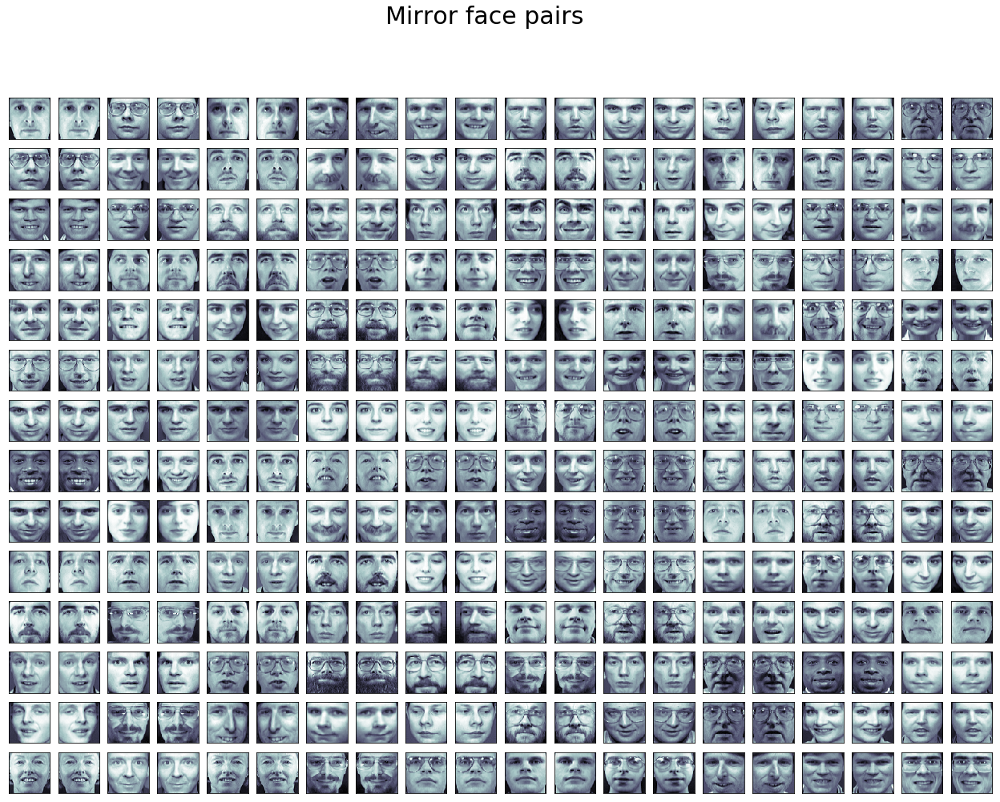

In [168]:
# View few mirror faces from training data
fig, axes = plt.subplots(14,20,figsize=(22,16),\
                        subplot_kw = {'xticks':[],'yticks':[]})

plt.suptitle('Mirror face pairs', fontsize = 30)

totface = faceimg_train.shape[0]

for i, ax in enumerate(axes.flat) :
    if (i % 2 ) == 0 :
        ax.imshow(faceimg_train[int(i/2),:,:].reshape(64,64), cmap = 'bone')
    else :
        ax.imshow(faceimg_train[int((i-1 + totface)/2),:,:].reshape(64,64), cmap = 'bone')

In [169]:
# Flatten all images
X_train = faceimg_train.reshape(faceimg_train.shape[0],-1)
X_test = faceimg_test.reshape(faceimg_test.shape[0],-1)
Y_train = facetrg_train.reshape(-1,1) 
Y_test = facetrg_test.reshape(-1,1)

# PCA
max_features = 200
pca = PCA(n_components=max_features)
pca.fit(X_train)

# Extract other informations
Eigen_val = pca.explained_variance_
Eigen_vec = pca.components_
Weight_train = pca.transform(X_train)
Weight_test = pca.transform(X_test)
Mean_face = pca.mean_


## Test model using Mirror faces

In [170]:
Train_out = dict(); Test_out = dict();  model = dict()

In [171]:
# Model to predict class based on euclidean distance of weights from mean of each class
model['DISTEU'] = Dist_mod(typ='eu')
Train_out['DISTEU'], Test_out['DISTEU'] = model_find_components(model['DISTEU'], \
                                            Weight_train, Y_train, Weight_test, Y_test, plot = 'N')

In [172]:
# Model to predict class based on euclidean distance of weights from mean of each class
model['DISTMH'] = Dist_mod(typ='mh')
Train_out['DISTMH'], Test_out['DISTMH'] = model_find_components(model['DISTMH'], \
                                            Weight_train, Y_train, Weight_test, Y_test, plot = 'N')

In [173]:
# Support vector machine (RBF kernel)
model['SVCRBF'] = SVC(kernel='rbf', gamma='auto')
Train_out['SVCRBF'], Test_out['SVCRBF'] = model_find_components(model['SVCRBF'], \
                                            Weight_train, Y_train, Weight_test, Y_test, plot = 'N')

In [174]:
# KNN model (Euclidean distance and 1 neighbour)
model['KNN1EU'] = KNeighborsClassifier(n_neighbors=1)
Train_out['KNN1EU'], Test_out['KNN1EU'] = model_find_components(model['KNN1EU'],\
                                            Weight_train, Y_train, Weight_test, Y_test, plot = 'N')

In [175]:
# KNN model (Mahalanobis distance and 1 neighbour)
model['KNN1MH'] = KNeighborsClassifier(n_neighbors=1)
W_train = Weight_train / np.sqrt(Eigen_val)
W_test = Weight_test / np.sqrt(Eigen_val)
Train_out['KNN1MH'], Test_out['KNN1MH'] = model_find_components(model['KNN1MH'],\
                                            W_train, Y_train, W_test, Y_test, plot = 'N')

In [176]:
Method = dict()
Method['SVCRBF'] = 'SVC RBF (Weights)'
Method['DISTEU'] = 'Class Mean EU distance'
Method['DISTMH'] = 'Class Mean MH distance'
Method['KNN1EU'] = 'KNN 1 neigbour and EU distance (Weights)'
Method['KNN1MH'] = 'KNN 1 neigbour and MH distance (Weights)'

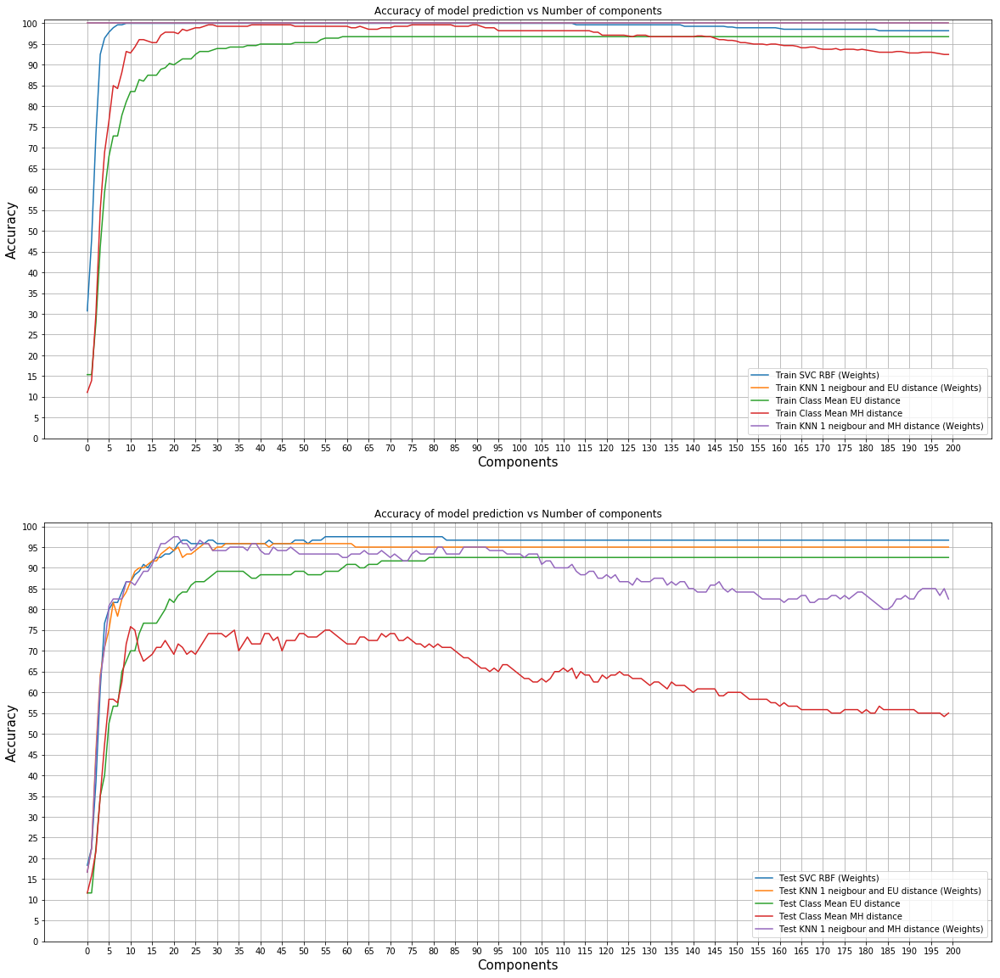

In [177]:
# Plot all output
fig, axes = plt.subplots(2,1,figsize=(20,20))

for i, ax in enumerate(axes.flat) :
    for key in Train_out.keys():
        if i == 0 :
            ax.plot(Train_out[key], label = 'Train ' + Method[key])            
        else :
            ax.plot(Test_out[key], label = 'Test '+ Method[key])

    ax.legend(loc = 'lower right')
    ax.set_xlabel('Components', fontsize=15)
    ax.set_ylabel('Accuracy', fontsize=15)
    ax.set_title('Accuracy of model prediction vs Number of components')
    ax.set_ylim(0,101)
    ax.set_yticks(np.arange(0,101,5))
    ax.set_xticks(np.arange(0,201,5))
    ax.grid()

plt.show()


# Random faces/Noise

## Regenerate using Eigen faces

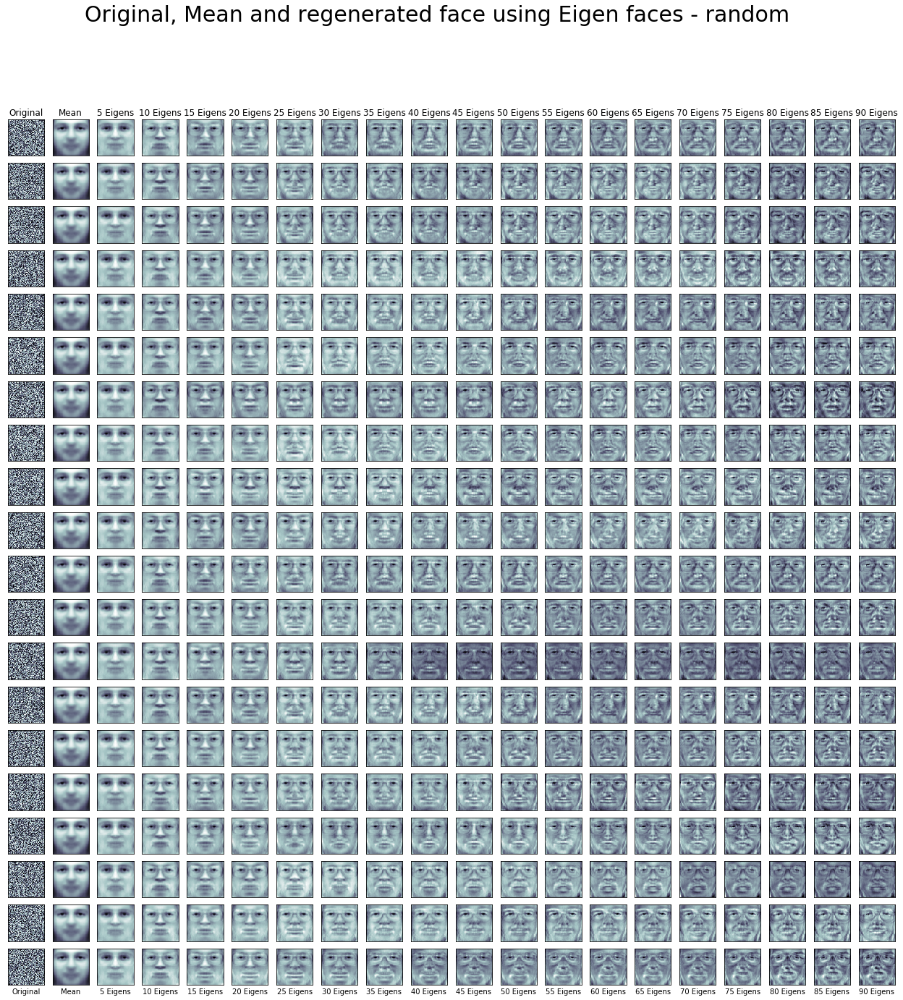

In [21]:
# Pick some random numbers and generate 20 images and then find its PCA and Eigen faces
Random_face = np.random.random([20,64,64])
Weight_random = pca.transform(Random_face.reshape(20,-1))
show_regenerated_faces(Random_face.reshape(20,-1), Weight_random, 'random')

You would see that image having random noice is developed into some face with 60 Eigens which is NOT correct. And this is a drawback of only considering the weights. Ideally we can regenerate faces only if it the face falls in the distribution used for training and our test images are but the random images are NOT.

## Predict face

In [178]:
# Ramdom data
Z1 = Random_face[0:10,:,:]/10
Z2 = Random_face[10:20,:,:]

In [180]:
# Find Weights
Weight_Z1 = pca.transform(Z1.reshape(10,-1))
Weight_Z2 = pca.transform(Z2.reshape(10,-1))

In [183]:
# Model - train for 80 components
model['SVCRBF'].fit(Weight_train[:,0:80],Y_train.ravel())
model['DISTEU'].fit(Weight_train[:,0:80],Y_train.ravel())

In [185]:
# Prediction - SVCRBF and DISTEU
Y_Z101 = model['SVCRBF'].predict(Weight_Z1[:,0:80])
Y_Z102 = model['DISTEU'].predict(Weight_Z1[:,0:80],check_dist='Y',extr_dist='Y')

Y_Z201 = model['SVCRBF'].predict(Weight_Z2[:,0:80])
Y_Z202 = model['DISTEU'].predict(Weight_Z2[:,0:80],check_dist='Y',extr_dist='Y')

In [186]:
# Check results (Z1)
pd.DataFrame(np.vstack((Y_Z101,Y_Z102)).T)

,0,1,2
0,7.0,NaN,22.989221
1,7.0,NaN,23.040912
2,7.0,NaN,22.981212
3,7.0,NaN,23.029847
4,7.0,NaN,22.984550
5,7.0,NaN,22.966590
6,7.0,NaN,22.965931
7,7.0,NaN,22.975811
8,7.0,NaN,22.926759
9,7.0,NaN,22.978609


In [187]:
# Check results (Z2)
pd.DataFrame(np.vstack((Y_Z201,Y_Z202)).T)

,0,1,2
0,30.0,30.0,5.905892
1,30.0,30.0,5.316144
2,30.0,23.0,6.202784
3,30.0,30.0,5.563246
4,30.0,30.0,5.549621
5,30.0,30.0,5.325893
6,30.0,30.0,5.501882
7,30.0,30.0,5.088006
8,30.0,30.0,5.594890
9,30.0,30.0,5.725032


As you can see the draw back of SVC model is that it fails to reject the faces that could be noise or not catured in test. Our model that is based on distance, do solve this to some extent (as you would see Z1 has predicted class as NaN) however it doesn't reject all the time (as in Z2). We would create another function that would act as a filter to understand whether the face is one that we have trained.

# Final model

In [25]:
# Final model
model = SVC(kernel='rbf', gamma='auto')

# Pick 60 components
W_train = Weight_train[:,0:75]
W_test = Weight_test[:,0:75]

# Train the model
model.fit(W_train,Y_train.ravel())
    
# Predict the result
Y_train_pred = model.predict(W_train)
Y_test_pred = model.predict(W_test)

print("Train Accuracy : {} and Test Accuracy {}"\
      .format((np.sum(Y_train_pred.reshape(-1) == Y_train.reshape(-1))*100/Y_train.shape[0]), \
      np.sum(Y_test_pred.reshape(-1) == Y_test.reshape(-1))*100/Y_test.shape[0]))



Train Accuracy : 100.0 and Test Accuracy 97.5


## Faces that failed prediction

In [26]:
# Regenerate faces (that failed prediction)

# No of faces that failed detection
fail_count = np.sum(Y_test_pred.reshape(-1) != Y_test.reshape(-1))

failed_faces = list()
for i, _ in enumerate(Y_test_pred.reshape(-1)) :
    if Y_test_pred.reshape(-1)[i] != Y_test.reshape(-1)[i] :
        failed_faces.append(i)



In [27]:
# Failed pred table
pd.DataFrame(np.vstack((Y_test[failed_faces,:].ravel(),Y_test_pred[failed_faces])).T, columns=['Actual', 'Prediction'])

,Actual,Prediction
0,7,0
1,21,38
2,9,7


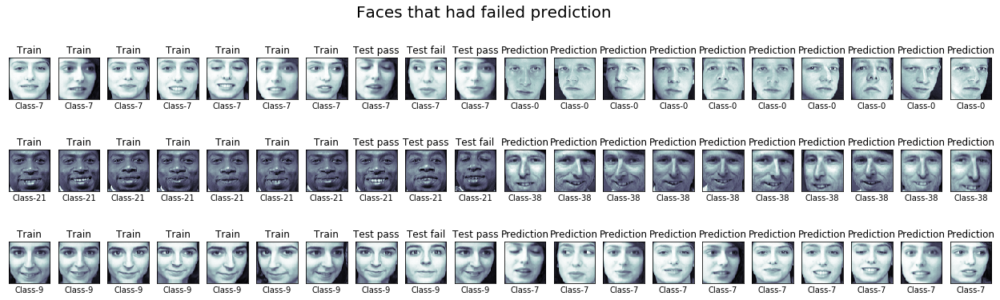

In [28]:
# View all the failed faces + the prediction
fig, axes = plt.subplots(fail_count,20,figsize=(22,(fail_count)*2),\
                            subplot_kw = {'xticks':[],'yticks':[]})

plt.suptitle('Faces that had failed prediction', fontsize = 20)

ax = axes.flat
j = 0

for Y in Y_test[failed_faces,:].ravel() :
    
    fail = -9
    for i,Y1 in enumerate(Y_train[0:280,:].ravel()) :
        if Y1 == Y :
            ax[j].imshow(X_train[i,:].reshape(64,64), cmap = 'bone')
            title = "Train"
            ax[j].set_title(title)
            ax[j].set_xlabel('Class-' + str(Y))
            j += 1
            
    for i,Y1 in enumerate(Y_test.ravel()) :
        if Y1 == Y :
            ax[j].imshow(X_test[i,:].reshape(64,64), cmap = 'bone')        
            if i in failed_faces :
                title = "Test fail"
                fail = i
            else :
                title = "Test pass"
            ax[j].set_title(title)
            ax[j].set_xlabel('Class-' + str(Y))
            j += 1
            

    Y2 = Y_test_pred[fail] 
    for i,Y1 in enumerate(Y_test.ravel()) :
        if Y1 == Y2 :
            ax[j].imshow(X_test[i,:].reshape(64,64), cmap = 'bone')        
            title = "Prediction"
            ax[j].set_title(title)
            ax[j].set_xlabel('Class-' + str(Y2))
            j += 1
    
             
    for i,Y1 in enumerate(Y_train[0:280,:].ravel()) :
        if Y1 == Y2 :
            ax[j].imshow(X_train[i,:].reshape(64,64), cmap = 'bone')
            title = "Prediction"
            ax[j].set_title(title)
            ax[j].set_xlabel('Class-' + str(Y2))
            j += 1



In [161]:
X_test[40,:].mean()

0.6362638

In [162]:
X_test[109,:].mean()

0.38230908

In [164]:
np.sort(np.array([X_test[i,:].mean() for i in range(120)]))

array([0.38230908, 0.39493984, 0.40593928, 0.40709844, 0.40853706,
       0.40921095, 0.41561815, 0.42654294, 0.43501523, 0.43577588,
       0.43714288, 0.45218375, 0.46395293, 0.47954667, 0.4796496 ,
       0.47986752, 0.48406932, 0.48552507, 0.48679924, 0.48819044,
       0.4901678 , 0.49143693, 0.49207354, 0.4984464 , 0.5020439 ,
       0.5021922 , 0.5022931 , 0.5048344 , 0.505471  , 0.5070397 ,
       0.5108057 , 0.5110146 , 0.51104385, 0.51160574, 0.5132421 ,
       0.5137536 , 0.51671255, 0.51996607, 0.52764845, 0.53139627,
       0.5322115 , 0.5342977 , 0.5366786 , 0.5371578 , 0.5375432 ,
       0.5381969 , 0.5400431 , 0.5406    , 0.5415261 , 0.5415947 ,
       0.54359525, 0.5451045 , 0.54588026, 0.5467217 , 0.5469416 ,
       0.54735726, 0.54742885, 0.5488211 , 0.5488614 , 0.5503747 ,
       0.55039084, 0.55106676, 0.5511808 , 0.55287564, 0.5535617 ,
       0.55446154, 0.5546663 , 0.559423  , 0.55952287, 0.5598669 ,
       0.56239104, 0.56315374, 0.5634907 , 0.5639467 , 0.56423

## Save the data

In [129]:
# Let's save the data
np.save("Result01\X_train.npy", X_train)
np.save("Result01\X_test.npy", X_test)
np.save("Result01\Y_train.npy", Y_train)
np.save("Result01\Y_test.npy", Y_test)
np.save("Result01\Weight_train.npy", Weight_train)
np.save("Result01\Weight_test.npy", Weight_test)
np.save("Result01\Eigen_val.npy", Eigen_val)
np.save("Result01\Eigen_vec.npy", Eigen_vec)
np.save("Result01\Mean_face.npy", Mean_face)


# Summary

We have split the faces we have into train and test (stratified split), and generated PCA using train dataset. Using the PCA components , we can regenerate the faces back with as few as 60 weights only however the face to be regenerated should fall in the distribution of the training set.

Question is how do we know a regenerated face is a known face. We will see this and much more like modelling in a separate notebook.